In [37]:
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import contextily as ctx
import requests
from shapely.geometry import Point
from datetime import datetime
from tqdm import tqdm
import time
from collections import defaultdict
import seaborn as sns
from prophet import Prophet
from scipy.optimize import curve_fit
import numpy as n
from scipy.interpolate import CubicSpline
import itertools
from prophet.diagnostics import cross_validation, performance_metrics
import pickle
from scipy.stats import linregress
import ipyparallel as ipp
import numpy as np
from pykrige.ok import OrdinaryKriging
import matplotlib as mpl
from pyproj import Transformer
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [4]:
def fetch_counts_for_year(year):
    counts_for_year = defaultdict(int)
    offset = 0
    limit = 10000
    while True:
        url = (
            f"https://data.cnra.ca.gov/api/3/action/datastore_search?"
            f"resource_id=bfa9f262-24a1-45bd-8dc8-138bc8107266"
            f"&q={year}&limit={limit}&offset={offset}"
        )
        response = requests.get(url)
        if response.status_code == 200:
            data = response.json()
            records = data['result']['records']
            for record in records:
                site_code = record.get('site_code')
                if record.get('gse_gwe') is None:
                    continue
                if site_code:
                    counts_for_year[site_code] += 1
            if len(records) < limit:
                break
            offset += limit
        else:
            print(f"Failed to fetch data for year {year}")
            break
    return counts_for_year

rc = ipp.Client()
dview = rc[:]

with dview.sync_imports():
    import requests
    from collections import defaultdict

dview.push({'fetch_counts_for_year': fetch_counts_for_year})

years = list(range(2008, 2025))

async_results = dview.map_async(fetch_counts_for_year, years)
results = async_results.get()

counts = defaultdict(lambda: defaultdict(int))
for year, year_counts in zip(years, results):
    for site_code, count in year_counts.items():
        counts[site_code][year] = count

obs_df = pd.DataFrame.from_dict(counts, orient='index')
obs_df = obs_df.fillna(0).astype(int)
obs_df.columns = [f'observations_{year}' for year in obs_df.columns]
obs_df = obs_df.reset_index().rename(columns={'index': 'site_code'})

importing requests on engine(s)
importing defaultdict from collections on engine(s)


In [5]:
central = pd.read_csv("../data/central_stations_observations.csv")
cent_5021 = central[central.Basin_Subb.str.startswith("5-021")]

In [6]:
observation_columns = [col for col in obs_df.columns if col.startswith('observations_')]
ov25 = obs_df[obs_df[observation_columns].ge(25).all(axis=1)]

In [7]:
ov25_5021 = ov25[ov25.site_code.isin(cent_5021.site_code)].copy()

In [8]:
def fetch_all_records(site_code, year):
    all_records = []
    offset = 0
    limit = 1000
    while True:
        url = f"https://data.cnra.ca.gov/api/3/action/datastore_search?resource_id=bfa9f262-24a1-45bd-8dc8-138bc8107266&q={site_code} {year}&limit={limit}&offset={offset}"
        response = requests.get(url)
        if response.status_code == 200:
            data = response.json()
            records = data['result']['records']
            all_records.extend(records)
            if len(records) < limit:
                break
            offset += limit
        else:
            print(f"Failed to fetch data for {site_code} in {year}")
            break
    return all_records

def get_readings_for_site(site_code, years):
    all_readings = []
    for year in years:
        records = fetch_all_records(site_code, year)
        for record in records:
            reading = {
                'site_code': record.get('site_code'),
                'msmt_date': record.get('msmt_date'),
                'wlm_rpe': record.get('wlm_rpe'),
                'wlm_gse': record.get('wlm_gse'),
                'gwe': record.get('gwe')
            }
            all_readings.append(reading)
    return pd.DataFrame(all_readings)

def interpolate_gwe(site_code, years, readings_df):
    site_data = readings_df
    site_data.rename(columns={"msmt_date": "ds", "gwe": "y"}, inplace=True)
    site_data['ds'] = pd.to_datetime(site_data['ds'])

    full_date_range = pd.date_range(start=f"{min(years)}-01-01", end=f"{max(years)}-12-31", freq="D")
    full_df = pd.DataFrame({'ds': full_date_range})
    full_df = full_df.merge(site_data, on='ds', how='left')

    m = Prophet(
        changepoint_prior_scale=0.01,
        seasonality_prior_scale=0.01,
        yearly_seasonality=True
    )
    m.fit(site_data.dropna())

    forecast = m.predict(full_df)

    full_df['y_interpolated'] = forecast['yhat']

    result_df = full_df[['ds', 'y_interpolated']].copy()
    result_df.rename(columns={"ds": "date", "y_interpolated": "gwe_interpolated"}, inplace=True)

    return result_df

def gwe_trend(site_code, start_yr, end_yr):
    years = range(start_yr, end_yr + 1)
    readings_df = get_readings_for_site(site_code, years)
    predicted = interpolate_gwe(site_code, years, readings_df)

    predicted['date'] = pd.to_datetime(predicted['date'])
    predicted.set_index('date', inplace=True)

    monthly_avg = predicted.resample('M').mean()
    
    return monthly_avg

In [9]:
client = ipp.Client()
dview = client[:]
dview.push({'fetch_all_records': fetch_all_records,
           'get_readings_for_site':get_readings_for_site,
           'interpolate_gwe':interpolate_gwe,
           'gwe_trend':gwe_trend})

dview.execute("""
import pandas as pd
import requests
from prophet import Prophet
import logging
logging.getLogger("cmdstanpy").setLevel(logging.ERROR)
""")

view = client.load_balanced_view()

well_gwe_trends = {}

def process_well(well):
    return well, gwe_trend(well, 2008, 2024)

async_results = []
for well in ov25_5021.site_code.unique():
    async_result = view.apply_async(process_well, well)
    async_results.append(async_result)

for async_result in async_results:
    try:
        well, result = async_result.get()
        well_gwe_trends[well] = result
    except Exception as e:
        print(f"Error processing well {well}: {e}")

In [10]:
def calculate_groundwater_changes(data_dict):
    result_dict = {}
    for year in range(2008, 2024):
        year_dict = {}

        for site_code, df in data_dict.items():
            try:
                october_value = df.loc[f'{year}-10-31'].iloc[0]
                september_value = df.loc[f'{year+1}-09-30'].iloc[0]
                change = october_value - september_value
                year_dict[site_code] = change
            except KeyError:
                print(f"Warning: Missing data for site {site_code} in year {year} or {year+1}.")
                year_dict[site_code] = None

        result_dict[year] = year_dict

    return result_dict

In [11]:
well_changes = calculate_groundwater_changes(well_gwe_trends)

In [12]:
def get_precipitation_data(latitude, longitude, start_date, end_date, parameter="PRECTOTCORR"):
    base_url = "https://power.larc.nasa.gov/api/temporal/daily/point"
    
    params = {
        "parameters": parameter,
        "community": "AG",
        "longitude": longitude,
        "latitude": latitude,
        "start": start_date,
        "end": end_date,
        "format": "JSON"
    }

    response = requests.get(base_url, params=params)
    response.raise_for_status()

    data = response.json()

    try:
        precip_data = data["properties"]["parameter"][parameter]
    except KeyError as e:
        raise ValueError(f"Unable to retrieve parameter '{parameter}' from response: {e}")

    return precip_data

def process_precipitation_data(precip_data):
    df = pd.DataFrame.from_dict(precip_data, orient="index", columns=["precipitation"])
    df.index = pd.to_datetime(df.index)
    monthly_avg = df.resample("ME").mean()
    
    return monthly_avg

def get_monthly_precipitation_for_sites(df, start_date=2008, end_date=2024):
    result_dict = {}

    for index, row in tqdm(df.iterrows(), total=len(df), desc="Processing sites"):
        site_code = row["site_code"]
        latitude = row["latitude"]
        longitude = row["longitude"]

        try:
            precip_data = get_precipitation_data(latitude, longitude, start_date, end_date)
            monthly_avg = process_precipitation_data(precip_data)
            result_dict[site_code] = monthly_avg

        except Exception as e:
            print(f"Error processing site {site_code}: {e}")
            result_dict[site_code] = None

    return result_dict

In [13]:
ov25_5021 = pd.merge(ov25_5021, central[["site_code", "latitude", "longitude", "well_depth"]], on="site_code", how="inner")

In [14]:
precipitation_data = get_monthly_precipitation_for_sites(ov25_5021)

Processing sites: 100%|███████████████████████| 168/168 [09:02<00:00,  3.23s/it]


In [15]:
def calculate_annual_precipitation_averages(precipitation_dict):
    result_dict = {}
    for year in range(2008, 2024):
        year_dict = {}
        for site_code, monthly_avg in precipitation_dict.items():
            if monthly_avg is not None:
                try:
                    start_date = f"{year}-10-31"
                    end_date = f"{year+1}-09-30"
                    period_data = monthly_avg.loc[start_date:end_date]
                    average_precip = period_data["precipitation"].mean()
                    year_dict[site_code] = average_precip
                except KeyError:
                    print(f"Warning: Missing data for site {site_code} in year {year}.")
                    year_dict[site_code] = None
        result_dict[year] = year_dict
    return result_dict

In [16]:
well_precipitation = calculate_annual_precipitation_averages(precipitation_data)

In [17]:
wells = {}
for year, sites in well_precipitation.items():
    for site, precip in sites.items():
        wells.setdefault(site, []).append((year, precip))

SD_beneath = {}
for site, values in wells.items():
    precip_values = [precip for _, precip in values]
    mean_val = np.mean(precip_values)
    std_val = np.std(precip_values)
    threshold = mean_val - 0.5 * std_val
    SD_beneath[site] = [year for year, precip in values if precip < threshold]

In [18]:
gradients = {}
for site, years in SD_beneath.items():
    x = []
    y = []
    for year in years:
        if (year in well_precipitation and site in well_precipitation[year] and
            year in well_changes and site in well_changes[year]):
            x.append(well_precipitation[year][site])
            y.append(well_changes[year][site])
    if len(x) > 1:
        reg_result = linregress(x, y)
        gradients[site] = {"slope": reg_result.slope, "p_value": reg_result.pvalue}
    else:
        gradients[site] = {"slope": None, "p_value": None}

In [19]:
ov25_5021['gradient'] = ov25_5021['site_code'].map(lambda x: gradients.get(x, {}).get("slope", None))

In [20]:
SGMA = "../data/GWBasins.shp"
gdf = gpd.read_file(SGMA)
gdf.set_crs(epsg=3857, inplace=True)
gdf.set_index('OBJECTID', inplace=True)
gdf['Basin_Prefix'] = gdf['Basin_Numb'].str.split('-').str[0].astype(int)

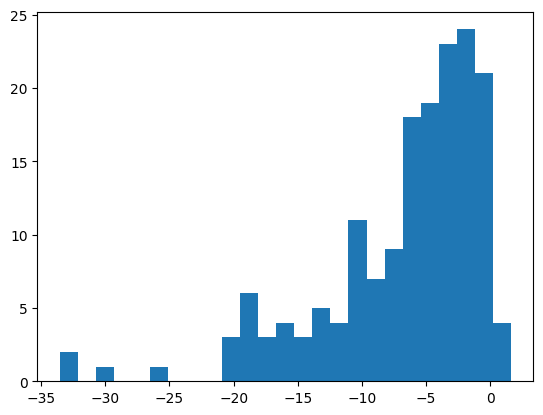

In [21]:
plt.hist(ov25_5021.gradient, bins=25)
plt.show()

In [22]:
stations_5021 = central[central.Basin_Subb.str.startswith("5-021")]
# stations_5021 = stations_5021[~stations_5021.well_depth.isna()]

In [23]:
stations_5021.describe()

,latitude,longitude,well_depth,observations_2010,observations_2011,observations_2012,observations_2013,observations_2014,observations_2015,observations_2016,observations_2017,observations_2018,observations_2019,observations_2020,observations_2021,observations_2022,observations_2023,observations_2024
count,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000,2102.000000
mean,39.059757,-121.789005,343.488582,45.272122,51.145576,59.457659,62.273549,60.556613,61.324453,57.588011,52.891056,57.567555,55.440533,58.331113,62.497146,64.044244,64.086108,58.764034
std,0.507967,0.284595,279.618111,112.279091,120.488541,130.964692,131.374413,126.815255,124.794012,123.436166,119.770680,124.415549,124.190926,123.012704,127.562469,131.348204,134.498397,121.280839
min,38.113000,-122.453250,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,38.667457,-122.025050,150.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
50%,38.924650,-121.797000,277.500000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,2.000000
75%,39.457030,-121.564923,460.000000,3.000000,4.000000,7.000000,12.000000,22.000000,24.000000,12.000000,9.000000,17.000000,10.000000,22.000000,28.750000,25.000000,12.000000,11.000000
max,40.265170,-121.116900,2370.000000,391.000000,384.000000,379.000000,396.000000,402.000000,425.000000,425.000000,421.000000,425.000000,423.000000,429.000000,488.000000,756.000000,1283.000000,382.000000


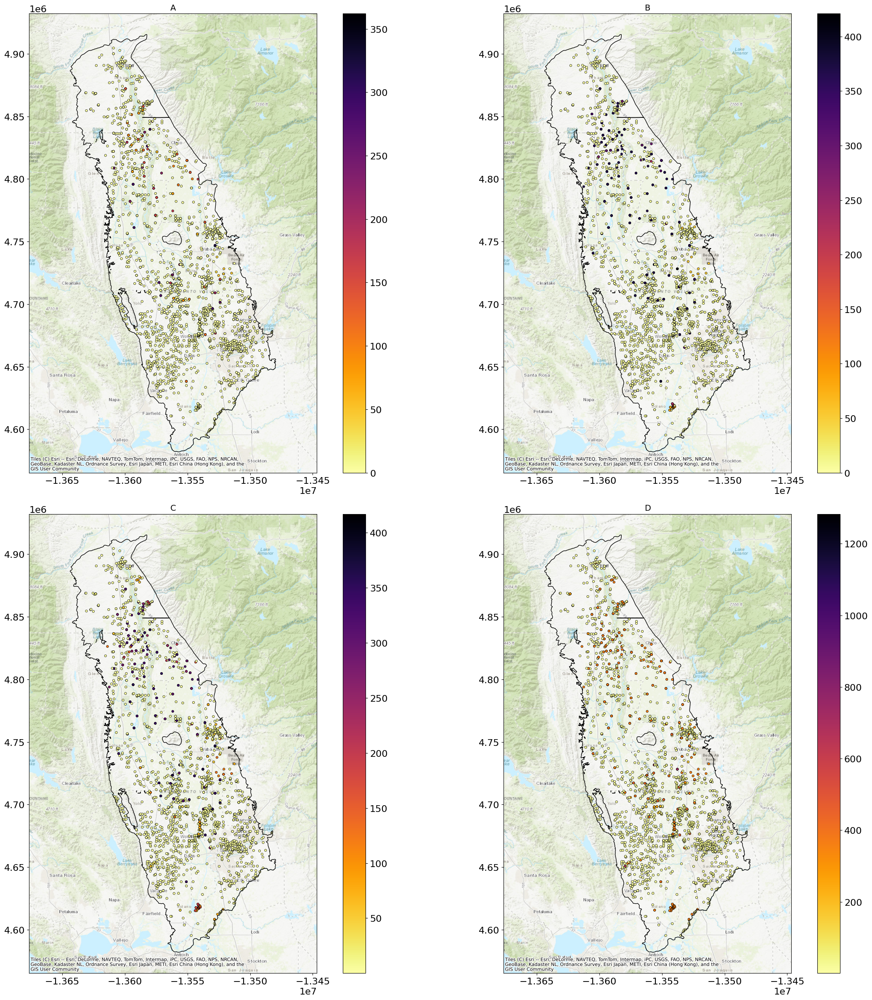

In [41]:
stations_gdf = gpd.GeoDataFrame(
    stations_5021,
    geometry=gpd.points_from_xy(stations_5021.longitude, stations_5021.latitude),
    crs="EPSG:4326"  # Assuming lat/lon in WGS84
)

# ------------------------------------------------------------------------
# 2) EXTRACT THE BASIN POLYGON FOR BASIN "5-021"
# ------------------------------------------------------------------------
filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']
# Dissolve into one polygon (in case the basin is multi-part)
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(
    geometry=[larger_polygon],
    crs=filtered_gdf.crs
)

# ------------------------------------------------------------------------
# 3) CONVERT BOTH GeoDataFrames TO WEB MERCATOR (EPSG:3857)
# ------------------------------------------------------------------------
stations_gdf = stations_gdf.to_crs(epsg=3857)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=3857)

# ------------------------------------------------------------------------
# 4) CREATE NEW COLUMNS FOR MIN, MEDIAN, MEAN, AND MAX OF "observations_*"
# ------------------------------------------------------------------------
obs_cols = [col for col in stations_gdf.columns if col.startswith("observations_")]
stations_gdf["observations_min"] = stations_gdf[obs_cols].min(axis=1)
stations_gdf["observations_median"] = stations_gdf[obs_cols].median(axis=1)
stations_gdf["observations_mean"] = stations_gdf[obs_cols].mean(axis=1)
stations_gdf["observations_max"] = stations_gdf[obs_cols].max(axis=1)

# ------------------------------------------------------------------------
# 5) CREATE A FIGURE WITH 2 ROWS AND 2 COLUMNS OF SUBPLOTS (Square layout)
# ------------------------------------------------------------------------
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(24, 24))
(ax1, ax2), (ax3, ax4) = axes

# We'll compute bounding box once so all subplots share the same extent
stations_bounds = stations_gdf.total_bounds  # [xmin, ymin, xmax, ymax]
polygon_bounds = larger_polygon_gdf.total_bounds

xmin = min(stations_bounds[0], polygon_bounds[0])
ymin = min(stations_bounds[1], polygon_bounds[1])
xmax = max(stations_bounds[2], polygon_bounds[2])
ymax = max(stations_bounds[3], polygon_bounds[3])

# Add margin around the bounds
x_margin = 0.20 * (xmax - xmin)
y_margin = 0.05 * (ymax - ymin)

xrange = (xmin - x_margin, xmax + x_margin)
yrange = (ymin - y_margin, ymax + y_margin)

# Helper function to add basemap and force square aspect ratio
def setup_axis(ax, title):
    ax.set_xlim(xrange)
    ax.set_ylim(yrange)
    # Force the axis to be square
    ax.set_aspect('equal', adjustable='box')
    ctx.add_basemap(ax, source=ctx.providers.Esri.WorldTopoMap)
    ax.set_title(title, fontsize=14)

# ------------------------------------------------------------------------
# MAP 1 (Top-Left): Min of Observations
# ------------------------------------------------------------------------
larger_polygon_gdf.boundary.plot(ax=ax1, color='black', linewidth=1)
stations_gdf.plot(
    column='observations_min',
    ax=ax1,
    cmap='inferno_r',  # Inverted inferno
    marker='o',
    markersize=15,
    legend=True,
    edgecolor='black',  # Thin black border around each point
    linewidth=0.5
)
setup_axis(ax1, "A")

# ------------------------------------------------------------------------
# MAP 2 (Top-Right): Median of Observations
# ------------------------------------------------------------------------
larger_polygon_gdf.boundary.plot(ax=ax2, color='black', linewidth=1)
stations_gdf.plot(
    column='observations_median',
    ax=ax2,
    cmap='inferno_r',
    marker='o',
    markersize=15,
    legend=True,
    edgecolor='black',
    linewidth=0.5
)
setup_axis(ax2, "B")

# ------------------------------------------------------------------------
# MAP 3 (Bottom-Left): Mean of Observations
# ------------------------------------------------------------------------
larger_polygon_gdf.boundary.plot(ax=ax3, color='black', linewidth=1)
stations_gdf.plot(
    column='observations_mean',
    ax=ax3,
    cmap='inferno_r',
    marker='o',
    markersize=15,
    legend=True,
    edgecolor='black',
    linewidth=0.5
)
setup_axis(ax3, "C")

# ------------------------------------------------------------------------
# MAP 4 (Bottom-Right): Max of Observations
# ------------------------------------------------------------------------
larger_polygon_gdf.boundary.plot(ax=ax4, color='black', linewidth=1)
stations_gdf.plot(
    column='observations_max',
    ax=ax4,
    cmap='inferno_r',
    marker='o',
    markersize=15,
    legend=True,
    edgecolor='black',
    linewidth=0.5
)
setup_axis(ax4, "D")

plt.tight_layout()
plt.show()

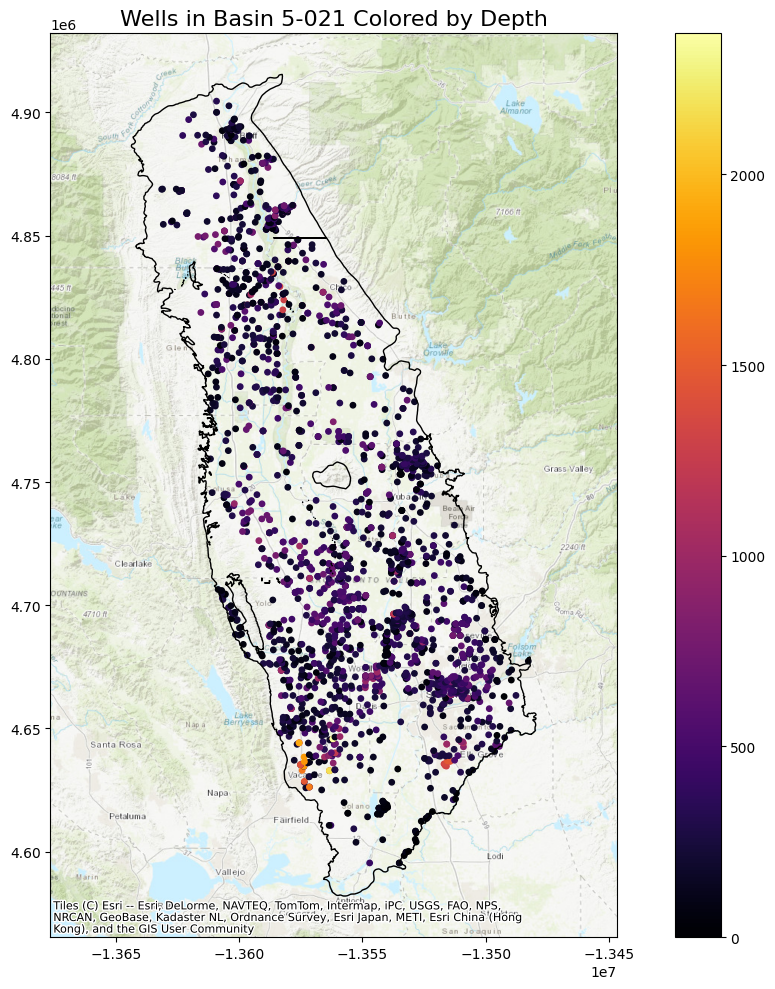

In [25]:
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

# --- Convert your stations_5021 DataFrame into a GeoDataFrame ---
stations_gdf = gpd.GeoDataFrame(
    stations_5021,
    geometry=gpd.points_from_xy(stations_5021.longitude, stations_5021.latitude),
    crs="EPSG:4326"  # assuming the lat/lon are in WGS84
)

# --- Create the basin polygon for Basin 5-021 ---
filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(geometry=[larger_polygon], crs=filtered_gdf.crs)

# --- Convert both GeoDataFrames to Web Mercator (EPSG:3857) ---
stations_gdf = stations_gdf.to_crs(epsg=3857)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=3857)

# --- Plotting ---
fig, ax = plt.subplots(figsize=(12, 10))

# Plot the basin polygon boundary and the well points.
larger_polygon_gdf.boundary.plot(ax=ax, color='black', linewidth=1)
stations_gdf.plot(column='well_depth', ax=ax, cmap='inferno', marker='o', markersize=15, legend=True)

# Compute combined bounds from both the well points and basin polygon.
stations_bounds = stations_gdf.total_bounds  # [xmin, ymin, xmax, ymax]
polygon_bounds = larger_polygon_gdf.total_bounds
xmin = min(stations_bounds[0], polygon_bounds[0])
ymin = min(stations_bounds[1], polygon_bounds[1])
xmax = max(stations_bounds[2], polygon_bounds[2])
ymax = max(stations_bounds[3], polygon_bounds[3])

# Add a margin (5% of the total range) around the bounds.
x_margin = 0.20 * (xmax - xmin)
y_margin = 0.05 * (ymax - ymin)
ax.set_xlim(xmin - x_margin, xmax + x_margin)
ax.set_ylim(ymin - y_margin, ymax + y_margin)

ctx.add_basemap(ax, source=ctx.providers.Esri.WorldTopoMap)

ax.set_title('Wells in Basin 5-021 Colored by Depth', fontsize=16)
plt.tight_layout()

plt.show()

In [26]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
data = []
for year, sites in well_changes.items():
    for site, change in sites.items():
        precip = well_precipitation.get(year, {}).get(site, None)
        if precip is not None:
            data.append({
                'year': year,
                'site_code': site,
                'change_in_GWE': change,
                'avg_precip': precip
            })

df = pd.DataFrame(data)

wells = df['site_code'].unique()

well_pca_results = {}

for well in wells:
    df_well = df[df['site_code'] == well]
    
    if len(df_well) < 2:
        print(f"Not enough data for well {well} to perform PCA.")
        continue
    
    X_well = df_well[['avg_precip', 'change_in_GWE']].values
    X_centered = X_well - np.mean(X_well, axis=0)
    
    pca = PCA(n_components=2)
    pca.fit(X_centered)
    
    pc1 = pca.components_[0]

    gradient = pc1[1] / pc1[0] if pc1[0] != 0 else np.nan
    
    well_pca_results[well] = {
        'pc1': pc1,
        'gradient': gradient,
        'explained_variance': pca.explained_variance_ratio_
    }

In [27]:
ov25_5021["pca_gradient"] = ov25_5021['site_code'].map(lambda x: well_pca_results.get(x, {}).get("gradient", None))

In [28]:
ov25_5021

,site_code,observations_2008,observations_2009,observations_2010,observations_2011,observations_2012,observations_2013,observations_2014,observations_2015,observations_2016,...,observations_2020,observations_2021,observations_2022,observations_2023,observations_2024,latitude,longitude,well_depth,gradient,pca_gradient
0,388593N1214885W001,373,363,375,371,370,361,356,374,371,...,239,371,370,348,307,38.85930,-121.48850,700.0,0.172246,-9.309601
1,386782N1215943W002,372,371,375,94,170,343,307,374,373,...,302,264,373,366,369,38.67820,-121.59430,815.0,-7.528571,-4.367710
2,386864N1215222W002,372,367,374,371,370,359,255,292,362,...,331,427,320,320,369,38.68640,-121.52220,500.0,-3.486162,-5.464832
3,390284N1215155W001,366,354,353,348,342,423,61,37,36,...,52,52,52,52,50,39.02838,-121.51548,105.0,-1.367687,-11.455184
4,390084N1214989W001,362,354,326,142,265,409,74,47,48,...,52,52,52,52,50,39.00837,-121.49888,249.0,0.143918,0.035271
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,393042N1215970W001,373,375,374,371,369,362,367,372,293,...,369,357,372,369,339,39.30420,-121.59700,566.0,-8.822288,-10.005748
164,388813N1217525W001,363,365,365,374,378,376,317,371,263,...,365,430,373,367,170,38.86903,-121.75250,68.0,-3.361870,-3.661356
165,386464N1216675W003,372,350,374,377,374,341,347,401,308,...,371,189,163,262,341,38.64640,-121.66750,280.0,-1.385625,-6.449635
166,389116N1215238W001,282,258,375,371,370,210,377,332,370,...,374,371,304,367,369,38.91160,-121.52380,980.0,-9.755355,-9.488529


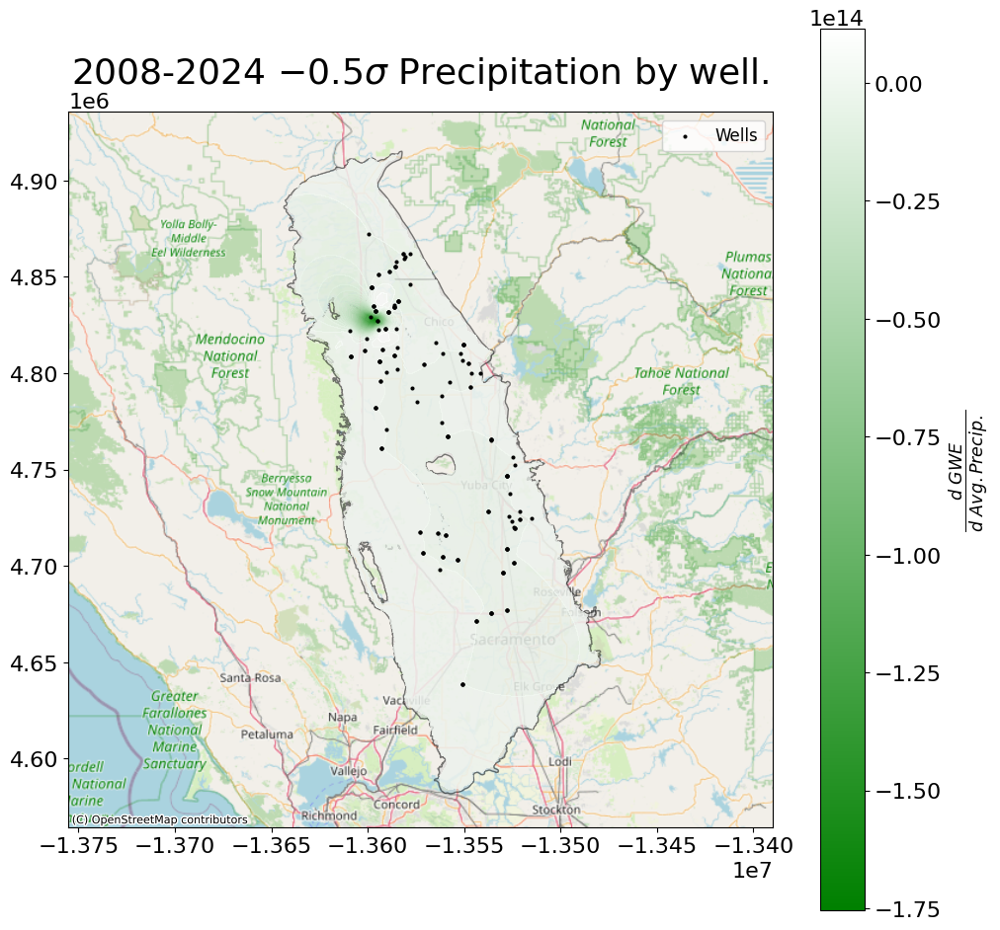

In [29]:
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 26,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'figure.titlesize': 32
})

filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(
    geometry=[larger_polygon],
    crs=filtered_gdf.crs
)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)
bounds = larger_polygon_gdf.total_bounds

wells_gdf = gpd.GeoDataFrame(
    ov25_5021,
    geometry=gpd.points_from_xy(
        ov25_5021['longitude'], 
        ov25_5021['latitude']
    ),
    crs="EPSG:4326"
)
wells_gdf = wells_gdf.to_crs(larger_polygon_gdf.crs)

x = wells_gdf.geometry.x
y = wells_gdf.geometry.y
z_slope = -np.exp(-wells_gdf['gradient'])

grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)

ok_slope = OrdinaryKriging(x, y, z_slope, variogram_model='linear')
z_interp_slope, ss_slope = ok_slope.execute('grid', grid_x, grid_y)

xx, yy = np.meshgrid(grid_x, grid_y)

grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(
    gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]),
    crs=larger_polygon_gdf.crs
)
mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0])
mask = mask.values.reshape(xx.shape)
z_interp_masked_slope = np.ma.masked_where(~mask, z_interp_slope)

slope_vals = z_interp_masked_slope.compressed()
min_val = slope_vals.min()
max_val = slope_vals.max()
norm = mpl.colors.TwoSlopeNorm(vmin=min_val, vcenter=(min_val+max_val)/2, vmax=max_val)

colors = ["green", "white"]
cmap = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

larger_polygon_3857 = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857 = wells_gdf.to_crs(epsg=3857)

transformer = Transformer.from_crs("EPSG:32633", "EPSG:3857", always_xy=True)
xx_3857, yy_3857 = transformer.transform(xx, yy)

fig, ax = plt.subplots(figsize=(10, 10), constrained_layout=True)

larger_polygon_3857.plot(ax=ax, color='lightgray', edgecolor='black', alpha=0.5)

contour_slope = ax.contourf(
    xx_3857, yy_3857,
    z_interp_masked_slope,
    levels=50,
    cmap=cmap,
    norm=norm,
    alpha=0.7
)

wells_gdf_3857.plot(ax=ax, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title(r"$\frac{d\ GWE}{d\ Avg. Precip.}$", fontsize=16)
ax.set_aspect('equal')
ax.legend(fontsize=12)

sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(
    sm, 
    ax=ax,
    fraction=0.1,
    shrink=0.9,
    pad=0.02
)
cbar.set_label(r"$\frac{d\ GWE}{d\ Avg. Precip.}$", fontsize=18)

plt.title(f"2008-2024 $-0.5 \sigma$ Precipitation by well.")
plt.show()

In [30]:
wells = {}
for year, sites in well_precipitation.items():
    for site, precip in sites.items():
        wells.setdefault(site, []).append((year, precip))

SD_above = {}
for site, values in wells.items():
    precip_values = [precip for _, precip in values]
    mean_val = np.mean(precip_values)
    std_val = np.std(precip_values)
    threshold = mean_val + 0.5 * std_val
    SD_above[site] = [year for year, precip in values if precip < threshold]

In [31]:
gradients = {}
for site, years in SD_above.items():
    x = []
    y = []
    for year in years:
        if (year in well_precipitation and site in well_precipitation[year] and
            year in well_changes and site in well_changes[year]):
            x.append(well_precipitation[year][site])
            y.append(well_changes[year][site])
    if len(x) > 1:
        reg_result = linregress(x, y)
        gradients[site] = {"slope": reg_result.slope, "p_value": reg_result.pvalue}
    else:
        gradients[site] = {"slope": None, "p_value": None}

In [32]:
ov25_5021['gradient_above'] = ov25_5021['site_code'].map(lambda x: gradients.get(x, {}).get("slope", None))

In [33]:
ov25_5021

,site_code,observations_2008,observations_2009,observations_2010,observations_2011,observations_2012,observations_2013,observations_2014,observations_2015,observations_2016,...,observations_2021,observations_2022,observations_2023,observations_2024,latitude,longitude,well_depth,gradient,pca_gradient,gradient_above
0,388593N1214885W001,373,363,375,371,370,361,356,374,371,...,371,370,348,307,38.85930,-121.48850,700.0,0.172246,-9.309601,-8.109537
1,386782N1215943W002,372,371,375,94,170,343,307,374,373,...,264,373,366,369,38.67820,-121.59430,815.0,-7.528571,-4.367710,-4.738930
2,386864N1215222W002,372,367,374,371,370,359,255,292,362,...,427,320,320,369,38.68640,-121.52220,500.0,-3.486162,-5.464832,-3.376056
3,390284N1215155W001,366,354,353,348,342,423,61,37,36,...,52,52,52,50,39.02838,-121.51548,105.0,-1.367687,-11.455184,1.147447
4,390084N1214989W001,362,354,326,142,265,409,74,47,48,...,52,52,52,50,39.00837,-121.49888,249.0,0.143918,0.035271,0.013589
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,393042N1215970W001,373,375,374,371,369,362,367,372,293,...,357,372,369,339,39.30420,-121.59700,566.0,-8.822288,-10.005748,-4.402156
164,388813N1217525W001,363,365,365,374,378,376,317,371,263,...,430,373,367,170,38.86903,-121.75250,68.0,-3.361870,-3.661356,-1.611951
165,386464N1216675W003,372,350,374,377,374,341,347,401,308,...,189,163,262,341,38.64640,-121.66750,280.0,-1.385625,-6.449635,-1.502796
166,389116N1215238W001,282,258,375,371,370,210,377,332,370,...,371,304,367,369,38.91160,-121.52380,980.0,-9.755355,-9.488529,-11.876843


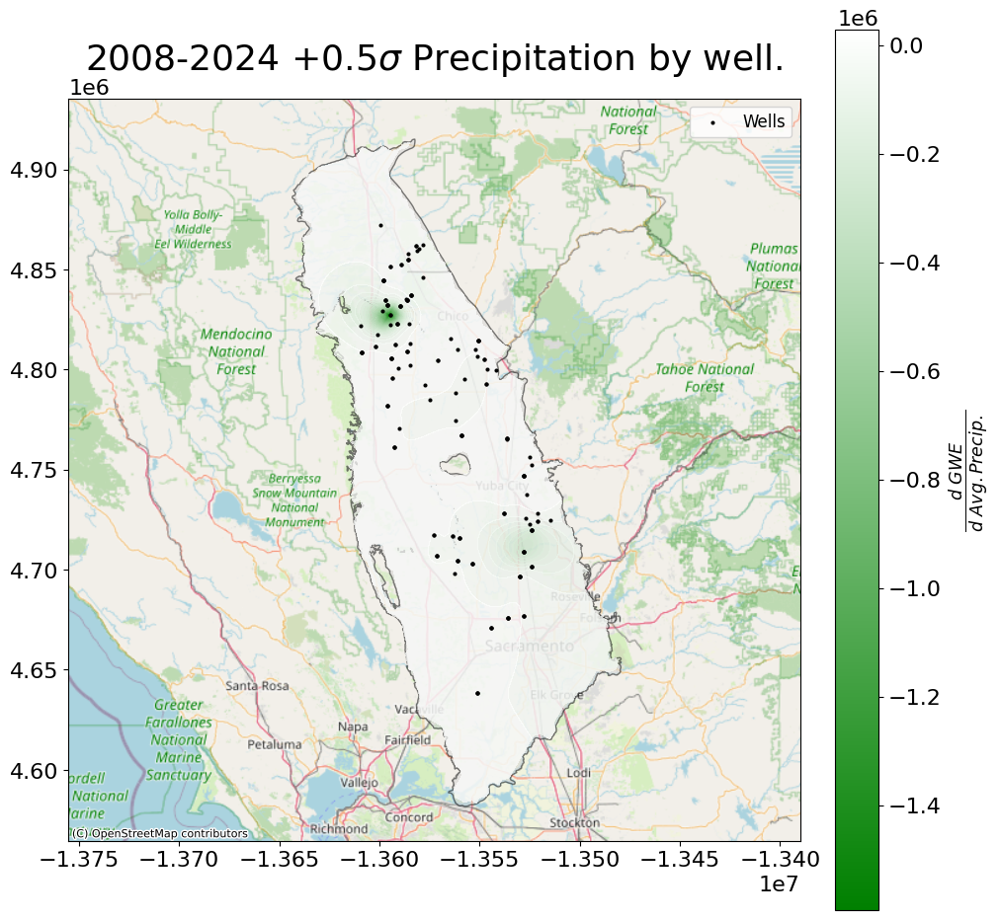

In [34]:
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 26,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'figure.titlesize': 32
})

filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(
    geometry=[larger_polygon],
    crs=filtered_gdf.crs
)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)
bounds = larger_polygon_gdf.total_bounds

wells_gdf = gpd.GeoDataFrame(
    ov25_5021,
    geometry=gpd.points_from_xy(
        ov25_5021['longitude'], 
        ov25_5021['latitude']
    ),
    crs="EPSG:4326"
)
wells_gdf = wells_gdf.to_crs(larger_polygon_gdf.crs)

x = wells_gdf.geometry.x
y = wells_gdf.geometry.y
z_slope = -np.exp(-wells_gdf['gradient_above'])

grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)

ok_slope = OrdinaryKriging(x, y, z_slope, variogram_model='linear')
z_interp_slope, ss_slope = ok_slope.execute('grid', grid_x, grid_y)

xx, yy = np.meshgrid(grid_x, grid_y)

grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(
    gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]),
    crs=larger_polygon_gdf.crs
)
mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0])
mask = mask.values.reshape(xx.shape)
z_interp_masked_slope = np.ma.masked_where(~mask, z_interp_slope)

slope_vals = z_interp_masked_slope.compressed()
min_val = slope_vals.min()
max_val = slope_vals.max()
norm = mpl.colors.TwoSlopeNorm(vmin=min_val, vcenter=(min_val+max_val)/2, vmax=max_val)

colors = ["green", "white"]
cmap = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

larger_polygon_3857 = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857 = wells_gdf.to_crs(epsg=3857)

transformer = Transformer.from_crs("EPSG:32633", "EPSG:3857", always_xy=True)
xx_3857, yy_3857 = transformer.transform(xx, yy)

fig, ax = plt.subplots(figsize=(10, 10), constrained_layout=True)

larger_polygon_3857.plot(ax=ax, color='lightgray', edgecolor='black', alpha=0.5)

contour_slope = ax.contourf(
    xx_3857, yy_3857,
    z_interp_masked_slope,
    levels=50,
    cmap=cmap,
    norm=norm,
    alpha=0.7
)

wells_gdf_3857.plot(ax=ax, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax, crs=larger_polygon_3857.crs, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title(r"$\frac{d\ GWE}{d\ Avg. Precip.}$", fontsize=16)
ax.set_aspect('equal')
ax.legend(fontsize=12)

sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(
    sm, 
    ax=ax,
    fraction=0.1,
    shrink=0.9,
    pad=0.02
)
cbar.set_label(r"$\frac{d\ GWE}{d\ Avg. Precip.}$", fontsize=18)

plt.title(f"2008-2024 $+0.5 \sigma$ Precipitation by well.")
plt.show()

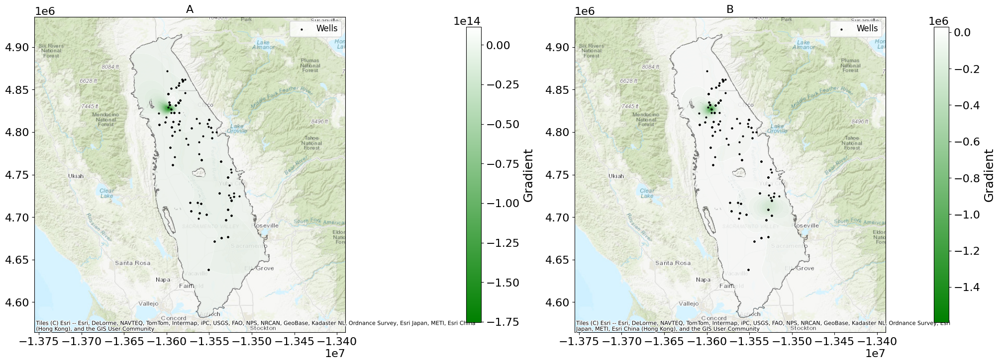

In [187]:
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 26,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'figure.titlesize': 32
})

# Filter and prepare the polygon
filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(geometry=[larger_polygon], crs=filtered_gdf.crs)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)
bounds = larger_polygon_gdf.total_bounds

# Prepare wells GeoDataFrame and project
wells_gdf = gpd.GeoDataFrame(
    ov25_5021,
    geometry=gpd.points_from_xy(ov25_5021['longitude'], ov25_5021['latitude']),
    crs="EPSG:4326"
)
wells_gdf = wells_gdf.to_crs(larger_polygon_gdf.crs)

# Define x and y coordinates from wells
x = wells_gdf.geometry.x
y = wells_gdf.geometry.y

# Define grid for interpolation
grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)
xx, yy = np.meshgrid(grid_x, grid_y)

# Create a GeoSeries of grid points and mask those outside the larger polygon
grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]), crs=larger_polygon_gdf.crs)
mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0])
mask = mask.values.reshape(xx.shape)

# Create a color map (you can adjust these colors as needed)
colors = ["green", "white"]
cmap = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

# Prepare CRS conversion to web mercator for plotting with basemap
larger_polygon_3857 = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857 = wells_gdf.to_crs(epsg=3857)
transformer = Transformer.from_crs("EPSG:32633", "EPSG:3857", always_xy=True)
xx_3857, yy_3857 = transformer.transform(xx, yy)

# Create the side-by-side subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), constrained_layout=True)

#############################################
# Left plot: using the "gradient" column
#############################################
# Compute transformed values for "gradient"
z_gradient = -np.exp(-wells_gdf['gradient'])
# Ordinary Kriging interpolation
ok_gradient = OrdinaryKriging(x, y, z_gradient, variogram_model='linear')
z_interp_gradient, ss_gradient = ok_gradient.execute('grid', grid_x, grid_y)
# Mask values outside the polygon
z_interp_masked_gradient = np.ma.masked_where(~mask, z_interp_gradient)
# Set normalization for the colormap
grad_vals = z_interp_masked_gradient.compressed()
min_val_grad = grad_vals.min()
max_val_grad = grad_vals.max()
norm_grad = mpl.colors.TwoSlopeNorm(vmin=min_val_grad,
                                      vcenter=(min_val_grad + max_val_grad)/2,
                                      vmax=max_val_grad)

# Plot polygon, contour and wells
larger_polygon_3857.plot(ax=ax1, color='lightgray', edgecolor='black', alpha=0.5)
contour_grad = ax1.contourf(xx_3857, yy_3857,
                            z_interp_masked_gradient,
                            levels=50,
                            cmap=cmap,
                            norm=norm_grad,
                            alpha=0.7)
wells_gdf_3857.plot(ax=ax1, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax1, crs=larger_polygon_3857.crs, source=ctx.providers.Esri.WorldTopoMap)
ax1.set_title("A", fontsize=16)
ax1.set_aspect('equal')
ax1.legend(fontsize=12)
# Add colorbar to the left plot
sm_grad = mpl.cm.ScalarMappable(norm=norm_grad, cmap=cmap)
sm_grad.set_array([])
cbar1 = fig.colorbar(sm_grad, ax=ax1, fraction=0.1, shrink=0.6, pad=0.02)
cbar1.set_label("Gradient", fontsize=18)

#############################################
# Right plot: using the "gradient_above" column
#############################################
# Compute transformed values for "gradient_above"
z_slope = -np.exp(-wells_gdf['gradient_above'])
# Ordinary Kriging interpolation
ok_slope = OrdinaryKriging(x, y, z_slope, variogram_model='linear')
z_interp_slope, ss_slope = ok_slope.execute('grid', grid_x, grid_y)
# Mask values outside the polygon
z_interp_masked_slope = np.ma.masked_where(~mask, z_interp_slope)
# Set normalization for the colormap
slope_vals = z_interp_masked_slope.compressed()
min_val_slope = slope_vals.min()
max_val_slope = slope_vals.max()
norm_slope = mpl.colors.TwoSlopeNorm(vmin=min_val_slope,
                                       vcenter=(min_val_slope + max_val_slope)/2,
                                       vmax=max_val_slope)

# Plot polygon, contour and wells
larger_polygon_3857.plot(ax=ax2, color='lightgray', edgecolor='black', alpha=0.5)
contour_slope = ax2.contourf(xx_3857, yy_3857,
                             z_interp_masked_slope,
                             levels=50,
                             cmap=cmap,
                             norm=norm_slope,
                             alpha=0.7)
wells_gdf_3857.plot(ax=ax2, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax2, crs=larger_polygon_3857.crs, source=ctx.providers.Esri.WorldTopoMap)
ax2.set_title("B", fontsize=16)
ax2.set_aspect('equal')
ax2.legend(fontsize=12)
# Add colorbar to the right plot
sm_slope = mpl.cm.ScalarMappable(norm=norm_slope, cmap=cmap)
sm_slope.set_array([])
cbar2 = fig.colorbar(sm_slope, ax=ax2, fraction=0.1, shrink=0.6, pad=0.02)
cbar2.set_label("Gradient", fontsize=18)

# Add a suptitle if desired
plt.show()

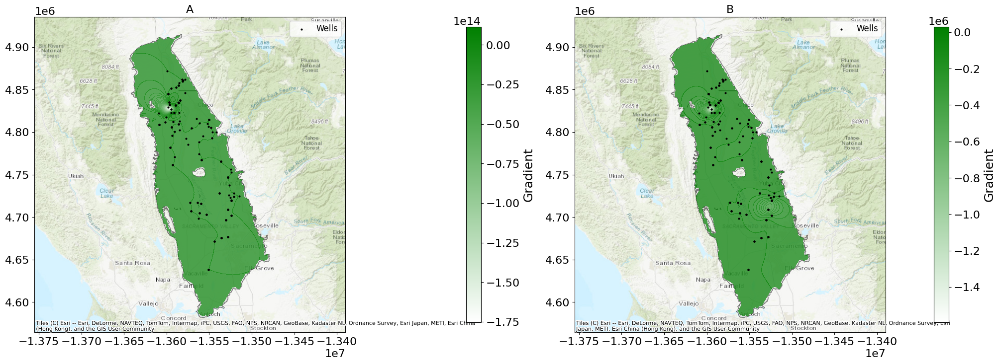

In [188]:
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 26,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'figure.titlesize': 32
})

# Filter and prepare the polygon
filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(geometry=[larger_polygon], crs=filtered_gdf.crs)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)
bounds = larger_polygon_gdf.total_bounds

# Prepare wells GeoDataFrame and project
wells_gdf = gpd.GeoDataFrame(
    ov25_5021,
    geometry=gpd.points_from_xy(ov25_5021['longitude'], ov25_5021['latitude']),
    crs="EPSG:4326"
)
wells_gdf = wells_gdf.to_crs(larger_polygon_gdf.crs)

# Define x and y coordinates from wells
x = wells_gdf.geometry.x
y = wells_gdf.geometry.y

# Define grid for interpolation
grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)
xx, yy = np.meshgrid(grid_x, grid_y)

# Create a GeoSeries of grid points and mask those outside the larger polygon
grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]), crs=larger_polygon_gdf.crs)
mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0])
mask = mask.values.reshape(xx.shape)

# Create a color map (you can adjust these colors as needed)
colors = ["white", "green"]
cmap = mpl.colors.LinearSegmentedColormap.from_list("brown_white_green", colors)

# Prepare CRS conversion to web mercator for plotting with basemap
larger_polygon_3857 = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857 = wells_gdf.to_crs(epsg=3857)
transformer = Transformer.from_crs("EPSG:32633", "EPSG:3857", always_xy=True)
xx_3857, yy_3857 = transformer.transform(xx, yy)

# Create the side-by-side subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), constrained_layout=True)

#############################################
# Left plot: using the "gradient" column
#############################################
# Compute transformed values for "gradient"
z_gradient = -np.exp(-wells_gdf['gradient'])
# Ordinary Kriging interpolation
ok_gradient = OrdinaryKriging(x, y, z_gradient, variogram_model='linear')
z_interp_gradient, ss_gradient = ok_gradient.execute('grid', grid_x, grid_y)
# Mask values outside the polygon
z_interp_masked_gradient = np.ma.masked_where(~mask, z_interp_gradient)
# Set normalization for the colormap
grad_vals = z_interp_masked_gradient.compressed()
min_val_grad = grad_vals.min()
max_val_grad = grad_vals.max()
norm_grad = mpl.colors.TwoSlopeNorm(vmin=min_val_grad,
                                      vcenter=(min_val_grad + max_val_grad)/2,
                                      vmax=max_val_grad)

# Plot polygon, contour and wells
larger_polygon_3857.plot(ax=ax1, color='lightgray', edgecolor='black', alpha=0.5)
contour_grad = ax1.contourf(xx_3857, yy_3857,
                            z_interp_masked_gradient,
                            levels=50,
                            cmap=cmap,
                            norm=norm_grad,
                            alpha=0.7)
wells_gdf_3857.plot(ax=ax1, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax1, crs=larger_polygon_3857.crs, source=ctx.providers.Esri.WorldTopoMap)
ax1.set_title("A", fontsize=16)
ax1.set_aspect('equal')
ax1.legend(fontsize=12)
# Add colorbar to the left plot
sm_grad = mpl.cm.ScalarMappable(norm=norm_grad, cmap=cmap)
sm_grad.set_array([])
cbar1 = fig.colorbar(sm_grad, ax=ax1, fraction=0.1, shrink=0.6, pad=0.02)
cbar1.set_label("Gradient", fontsize=18)

#############################################
# Right plot: using the "gradient_above" column
#############################################
# Compute transformed values for "gradient_above"
z_slope = -np.exp(-wells_gdf['gradient_above'])
# Ordinary Kriging interpolation
ok_slope = OrdinaryKriging(x, y, z_slope, variogram_model='linear')
z_interp_slope, ss_slope = ok_slope.execute('grid', grid_x, grid_y)
# Mask values outside the polygon
z_interp_masked_slope = np.ma.masked_where(~mask, z_interp_slope)
# Set normalization for the colormap
slope_vals = z_interp_masked_slope.compressed()
min_val_slope = slope_vals.min()
max_val_slope = slope_vals.max()
norm_slope = mpl.colors.TwoSlopeNorm(vmin=min_val_slope,
                                       vcenter=(min_val_slope + max_val_slope)/2,
                                       vmax=max_val_slope)

# Plot polygon, contour and wells
larger_polygon_3857.plot(ax=ax2, color='lightgray', edgecolor='black', alpha=0.5)
contour_slope = ax2.contourf(xx_3857, yy_3857,
                             z_interp_masked_slope,
                             levels=50,
                             cmap=cmap,
                             norm=norm_slope,
                             alpha=0.7)
wells_gdf_3857.plot(ax=ax2, marker='.', color='black', markersize=15, label='Wells')
ctx.add_basemap(ax2, crs=larger_polygon_3857.crs, source=ctx.providers.Esri.WorldTopoMap)
ax2.set_title("B", fontsize=16)
ax2.set_aspect('equal')
ax2.legend(fontsize=12)
# Add colorbar to the right plot
sm_slope = mpl.cm.ScalarMappable(norm=norm_slope, cmap=cmap)
sm_slope.set_array([])
cbar2 = fig.colorbar(sm_slope, ax=ax2, fraction=0.1, shrink=0.6, pad=0.02)
cbar2.set_label("Gradient", fontsize=18)

# Add a suptitle if desired
plt.show()

In [52]:
obs_5021 = obs_df[obs_df.site_code.isin(cent_5021.site_code)]
columns_to_keep = [
    col for col in obs_5021.columns 
    if not col.startswith('observations_') or (col.startswith('observations_') and int(col.split('_')[1]) >= 2015)
]
obs_5021 = obs_5021[columns_to_keep]

In [55]:
obs_cols_5021 = [col for col in obs_5021.columns if col.startswith('observations_')]
obs_5021 = obs_5021[obs_5021[obs_cols_5021].ge(4).all(axis=1)]

In [59]:
rc = ipp.Client()
dview = rc[:]  # Use all available engines

dview.push({'get_readings_for_site': get_readings_for_site})
dview.push({'obs_5021': obs_5021})

def process_site(site):
    return site, get_readings_for_site(site, range(2015, 2025))

results = dview.map_sync(process_site, obs_5021.site_code)
gwe_5021 = {site: readings for site, readings in results}

In [66]:
yearly_averages = {}

for site_code, df in tqdm(gwe_5021.items()):
    df['msmt_date'] = pd.to_datetime(df['msmt_date'])
    df['custom_year'] = df['msmt_date'].apply(lambda x: x.year if x.month < 10 else x.year + 1)
    yearly_avg = df.groupby('custom_year')['gwe'].mean()
    yearly_averages[site_code] = yearly_avg

100%|████████████████████████████████████████| 407/407 [00:01<00:00, 258.17it/s]


In [68]:
yearly_differences = {}

for site_code, yearly_avg in tqdm(yearly_averages.items()):
    yearly_avg = yearly_avg.sort_index()
    differences = yearly_avg.diff(-1).dropna()  # diff(-1) subtracts next year from current year
    yearly_differences[site_code] = differences

100%|███████████████████████████████████████| 407/407 [00:00<00:00, 1462.39it/s]


In [72]:
obs_5021 = pd.merge(cent_5021[["site_code", "latitude", "longitude"]], obs_5021, on='site_code', how='inner')

In [75]:
rain = get_monthly_precipitation_for_sites(obs_5021, start_date=2015, end_date=2025)

Processing sites:  51%|███████████▊           | 209/407 [13:20<13:29,  4.09s/it]

Error processing site 392424N1215030W001: 502 Server Error: Bad Gateway for url: https://power.larc.nasa.gov/api/temporal/daily/point?parameters=PRECTOTCORR&community=AG&longitude=-121.50294&latitude=39.24238&start=2015&end=2025&format=JSON


Processing sites:  56%|████████████▊          | 227/407 [14:30<10:36,  3.54s/it]

Error processing site 393054N1215973W002: 502 Server Error: Bad Gateway for url: https://power.larc.nasa.gov/api/temporal/daily/point?parameters=PRECTOTCORR&community=AG&longitude=-121.5973&latitude=39.3054&start=2015&end=2025&format=JSON


Processing sites:  59%|█████████████▌         | 239/407 [15:13<09:41,  3.46s/it]

Error processing site 393437N1219519W001: 502 Server Error: Bad Gateway for url: https://power.larc.nasa.gov/api/temporal/daily/point?parameters=PRECTOTCORR&community=AG&longitude=-121.9519&latitude=39.3437&start=2015&end=2025&format=JSON


Processing sites: 100%|███████████████████████| 407/407 [25:39<00:00,  3.78s/it]


In [96]:
def calculate_oct_to_sep_average_all_years(site_data):
    results = {}
    for site_code, df in site_data.items():
        if df is None:
            print(f"Warning: Dataframe for site {site_code} is None. Skipping.")
            continue
        if not isinstance(df.index, pd.DatetimeIndex):
            print(f"Warning: Index for site {site_code} is not a datetime index. Skipping.")
            continue
        min_year = df.index.min().year
        max_year = df.index.max().year
        site_results = {}
        for year_i in range(min_year, max_year):
            start_date = pd.Timestamp(year=year_i, month=10, day=1)
            end_date = pd.Timestamp(year=year_i + 1, month=9, day=30)
            filtered_df = df[(df.index >= start_date) & (df.index <= end_date)]
            if not filtered_df.empty:
                average_precipitation = filtered_df['precipitation'].mean()
            else:
                average_precipitation = None
            site_results[f"{year_i}"] = average_precipitation
        results[site_code] = site_results
    return results

In [97]:
averages = calculate_oct_to_sep_average_all_years(rain)

In [149]:
regression_results = {}

for site_code in yearly_differences:
    common_years = common_years = (set(map(str, yearly_differences[site_code].dropna().index)) 
    & set(map(str, averages.get(site_code, {}).keys())))
    
    x = []  # precipitation
    y = []  # change in GWE

    for year in common_years:
        gwe_change = yearly_differences[site_code].to_dict().get(int(year))
        precipitation = averages[site_code].get(year)

        if pd.notna(gwe_change) and precipitation is not None:
            x.append(precipitation)
            y.append(gwe_change)

    # Perform linear regression if sufficient data
    if len(x) >= 2:  # Require at least two points
        slope, intercept, r_value, p_value, std_err = linregress(x, y)
        regression_results[site_code] = {
            'slope': slope,
            'intercept': intercept,
            'r_value': r_value,
            'p_value': p_value,
            'std_err': std_err,
        }
    else:
        regression_results[site_code] = None  # insufficient data

In [161]:
obs_5021["slope"] = obs_5021.site_code.apply(lambda x: (regression_results.get(x) or {}).get("slope"))
obs_5021["p_slope"] = obs_5021.site_code.apply(lambda x: (regression_results.get(x) or {}).get("p_value"))

In [162]:
obs_5021

,site_code,latitude,longitude,observations_2015,observations_2016,observations_2017,observations_2018,observations_2019,observations_2020,observations_2021,observations_2022,observations_2023,observations_2024,slope,p_slope
0,381626N1213651W001,38.76263,-121.36510,11,12,11,11,12,12,12,12,12,10,-0.068945,0.462538
1,382211N1218425W001,38.22093,-121.84269,13,12,10,9,11,9,7,12,13,12,-0.076532,0.355019
2,382939N1213904W001,38.29429,-121.39060,12,13,9,11,11,8,11,12,13,12,-0.291611,0.342182
3,383270N1214736W001,38.32710,-121.47351,12,13,10,10,11,7,12,12,12,12,-0.103489,0.666522
4,384150N1213239W001,38.41505,-121.32382,17,11,11,11,11,6,12,12,12,11,-0.259887,0.245061
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
402,399733N1220069W002,39.97330,-122.00690,368,221,152,367,365,369,368,368,368,295,-0.038910,0.303422
403,399740N1219748W001,39.97397,-121.97484,366,369,368,368,366,219,368,368,368,295,-0.029033,0.201977
404,399740N1219748W002,39.97397,-121.97484,369,370,368,368,366,369,311,368,368,273,-0.016829,0.552162
405,400428N1221665W002,40.04281,-122.16651,341,296,304,369,368,195,266,371,372,373,-0.233764,0.377318


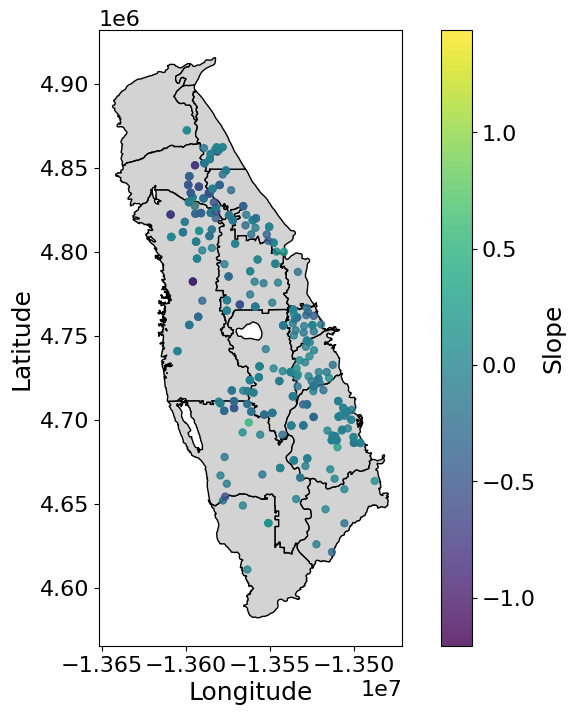

In [174]:
gdf_filtered = gdf[gdf['Basin_Numb'] == '5-021']

# --- Step 2: Convert your points DataFrame to a GeoDataFrame
# Replace EPSG:4326 with the correct CRS for your obs_5021 if it's different.
gdf_points = gpd.GeoDataFrame(
    obs_5021, 
    geometry=gpd.points_from_xy(obs_5021['longitude'], obs_5021['latitude'])
)
gdf_points.set_crs(epsg=4326, inplace=True)

# --- Step 3: Reproject the points to match the CRS of your polygons
gdf_points = gdf_points.to_crs(gdf_filtered.crs)

# --- Step 4: Plot the polygons and overlay the points colored by slope
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the polygons
gdf_filtered.plot(ax=ax, color='lightgrey', edgecolor='black')

# Plot the points
scatter = ax.scatter(
    gdf_points.geometry.x, 
    gdf_points.geometry.y, 
    c=gdf_points['slope'], 
    cmap='viridis', 
    s=25, 
    alpha=0.8
)

# Add a color bar to indicate slope values
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Slope')

# Add labels and title
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()

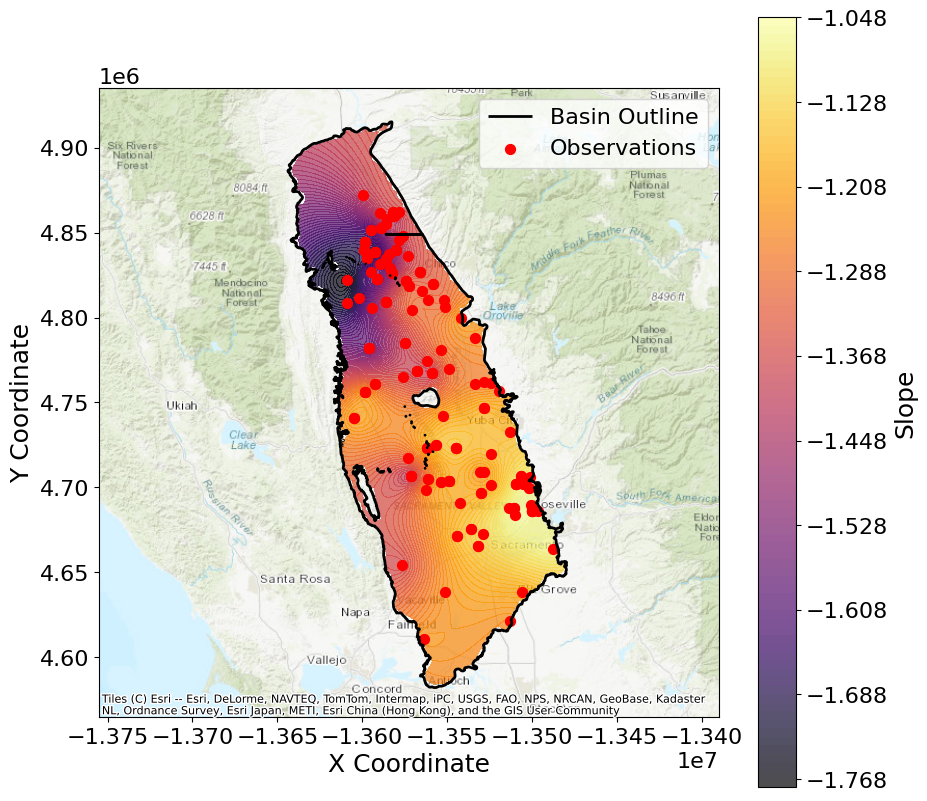

In [202]:
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 26,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 16,
    'figure.titlesize': 32
})

#######################################
# 1. Prepare the Basin Polygon
#######################################
# Filter the GeoDataFrame for Basin_Numb "5-021"
filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']

# Dissolve into a single polygon and create a new GeoDataFrame
larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(geometry=[larger_polygon], crs=filtered_gdf.crs)

# Reproject polygon to a projected CRS (e.g., EPSG:32633)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)
# Get total bounds: [minx, miny, maxx, maxy]
bounds = larger_polygon_gdf.total_bounds

#######################################
# 2. Prepare the Wells Data
#######################################
# Create a GeoDataFrame from your observation data, assuming obs_5021 has 'longitude', 'latitude', and 'slope'
wells_gdf = gpd.GeoDataFrame(
    obs_5021[obs_5021.p_slope < 0.5],
    geometry=gpd.points_from_xy(obs_5021[obs_5021.p_slope < 0.5]['longitude'], obs_5021[obs_5021.p_slope < 0.5]['latitude']),
    crs="EPSG:4326"
)
# Reproject the wells to match the polygon CRS (EPSG:32633)
wells_gdf = wells_gdf.to_crs(larger_polygon_gdf.crs)

# Extract x, y coordinates and the slope values
x = wells_gdf.geometry.x.values
y = wells_gdf.geometry.y.values
z = -np.exp(-wells_gdf['slope']).values

#######################################
# 3. Define the Interpolation Grid & Mask
#######################################
# Create a grid over the extent of the polygon
grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)
xx, yy = np.meshgrid(grid_x, grid_y)

# Create grid points and build a mask so that only points inside the polygon are used
grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]),
                                crs=larger_polygon_gdf.crs)
mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0])
mask = mask.values.reshape(xx.shape)

#######################################
# 4. Perform Ordinary Kriging
#######################################
# Create the Ordinary Kriging object
OK = OrdinaryKriging(x, y, z, variogram_model='exponential', verbose=False, enable_plotting=False)

# Execute the interpolation on the grid
z_interp, ss = OK.execute('grid', grid_x, grid_y)

# Mask out grid points outside the polygon
z_interp_masked = np.ma.masked_where(~mask, z_interp)

#######################################
# 5. Reproject Layers for Basemap Plotting (EPSG:3857)
#######################################
# Reproject polygon and wells for plotting with contextily
larger_polygon_3857 = larger_polygon_gdf.to_crs(epsg=3857)
wells_gdf_3857 = wells_gdf.to_crs(epsg=3857)

# Transform the interpolation grid coordinates to EPSG:3857
transformer = Transformer.from_crs("EPSG:32633", "EPSG:3857", always_xy=True)
xx_3857, yy_3857 = transformer.transform(xx, yy)

#######################################
# 6. Plot the Kriged Surface with Basin Outline and Wells
#######################################
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the kriged surface as a filled contour map
contour = ax.contourf(xx_3857, yy_3857, z_interp_masked, levels=100, cmap='inferno', alpha=0.7)
cbar = plt.colorbar(contour, ax=ax)
cbar.set_label('Slope')

# Plot the polygon outline (basin boundary)
larger_polygon_3857.boundary.plot(ax=ax, color='black', linewidth=2, label='Basin Outline')

# Plot the wells
wells_gdf_3857.plot(ax=ax, marker='o', color='red', markersize=50, label='Observations')

# Add a basemap using contextily
ctx.add_basemap(ax, crs=larger_polygon_3857.crs, source=ctx.providers.Esri.WorldTopoMap)

# Set plot labels and title
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.legend()

plt.show()